In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import tensorflow as tf
%matplotlib inline

2024-05-11 15:00:00.789850: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-11 15:00:00.789905: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-11 15:00:00.791513: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
data_path="/kaggle/input/art-portraits/Portraits/Portraits"
data=tf.keras.preprocessing.image_dataset_from_directory(data_path,label_mode=None,image_size=(64,64),batch_size=32)

Found 4117 files.


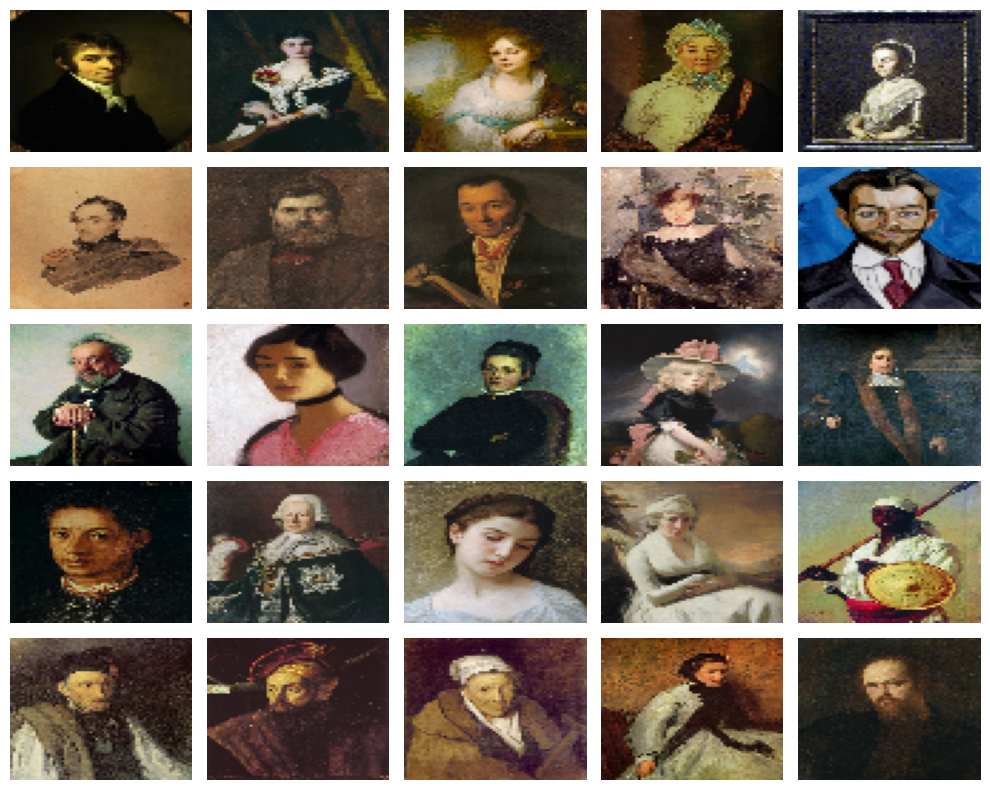

In [3]:
data = data.map(lambda x: x / 255.0)
images = next(iter(data.take(25)))

plt.figure(figsize=(10,8))
for i in range(25):
    plt.subplot(5,5, i + 1)
    plt.imshow(images[i].numpy())
    plt.axis("off")
    plt.gca().set_aspect('auto')

plt.tight_layout()
plt.show()

# Create Generator

In [4]:
from keras.models import Sequential
from keras.layers import Dense, Reshape, UpSampling2D, Conv2D, BatchNormalization, Activation

latent_dim=110
g_resolution=2
generator=Sequential()
generator.add(Dense(4*4*256,activation="relu",input_dim=latent_dim))
generator.add(Reshape((4,4,256)))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(128,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(Conv2D(3,kernel_size=3,padding="same"))
generator.add(Activation("tanh"))
generator.summary()



/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 4096)           │       454,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         3,459 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,526,979 (9.64 MB)

 Trainable params: 2,525,187 (9.63 MB)

 Non-trainable params: 1,792 (7.00 KB)

# Generate images without training

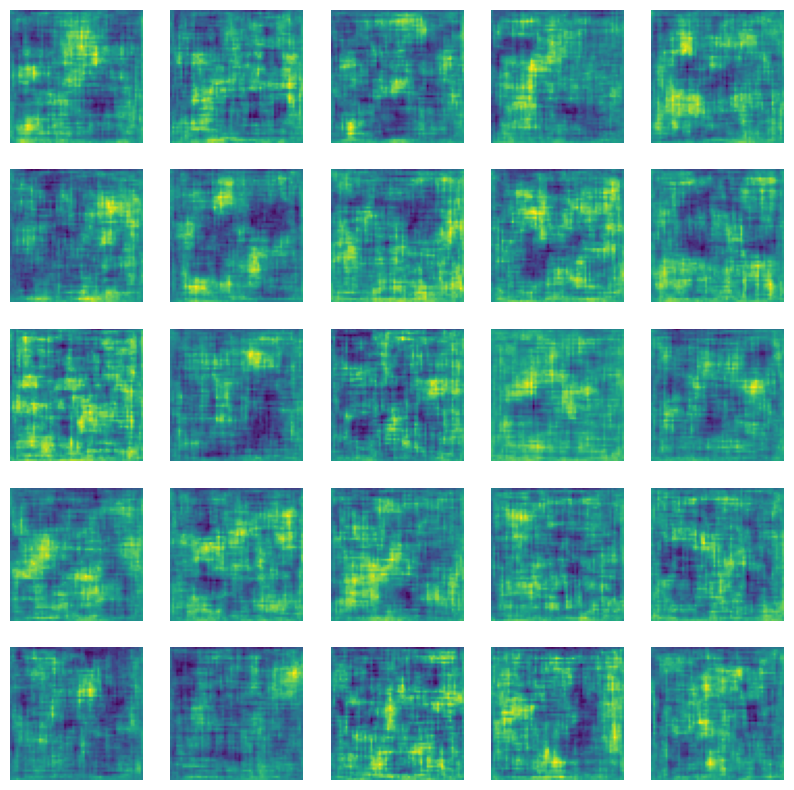

In [5]:

num_images = 25
random_vectors = tf.random.normal([num_images, latent_dim])
generated_images = generator(random_vectors, training=False)

plt.figure(figsize=(10, 10))
for i in range(num_images):
    plt.subplot(5, 5, i + 1)
    plt.imshow(generated_images[i, :, :, 0])
    plt.axis("off")
plt.show()


# Create Discriminator

In [6]:
from keras.layers import Conv2D, LeakyReLU, Dropout, ZeroPadding2D, BatchNormalization, Flatten, Dense


discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(64,64,3), padding="same"))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
discriminator.add(ZeroPadding2D(padding=((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation="sigmoid"))

discriminator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(
/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 17, 17, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 9, 9, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        41,473 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,613,889 (6.16 MB)

 Trainable params: 1,611,969 (6.15 MB)

 Non-trainable params: 1,920 (7.50 KB)

#### Let's now put this untrained discriminator to the test and see what judgment it renders for the image previously generated using random noise.








In [7]:
result = discriminator(generated_images)
print (result)

tf.Tensor(
[[0.498051  ]
 [0.49844807]
 [0.49850625]
 [0.498559  ]
 [0.49891767]
 [0.49862278]
 [0.49888432]
 [0.498342  ]
 [0.49908194]
 [0.49821392]
 [0.49829933]
 [0.4986654 ]
 [0.49910587]
 [0.49839923]
 [0.49926266]
 [0.4985033 ]
 [0.4983088 ]
 [0.49888217]
 [0.49888763]
 [0.49892905]
 [0.49851763]
 [0.49865156]
 [0.49872723]
 [0.49880883]
 [0.4989825 ]], shape=(25, 1), dtype=float32)


# Create GAN Model

In [8]:
class GAN(tf.keras.Model):
    def __init__(self,discriminator,generator,latent_dim):
        
        
    
        super().__init__()
        self.discriminator=discriminator
        self.generator=generator
        self.latent_dim=latent_dim
        self.seed_generator=tf.keras.random.SeedGenerator(1440)
    
    
    def compile(self,d_optimizer,g_optimizer,loss_fun):
        super().compile()
        self.d_optimizer=d_optimizer
        self.g_optimizer=g_optimizer
        self.loss_fun=loss_fun
        self.d_loss_metric=tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric=tf.keras.metrics.Mean(name="g_loss")
        
        
    @property
    
    def metrics(self):
        return [self.d_loss_metric,self.g_loss_metric]
    
    def train_step(self,real_image):
        batch_size=tf.shape(real_image)[0]
        random_vector=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        generated_images=self.generator(random_vector)
        combined_images=tf.concat([generated_images,real_image],axis=0)
        labels=tf.concat([tf.ones((batch_size,1)),tf.zeros((batch_size,1))],axis=0)
        labels+=0.05*tf.random.uniform(tf.shape(labels))
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(combined_images)
            d_loss=self.loss_fun(labels,predictions)
        grads=tape.gradient(d_loss,self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(grads,self.discriminator.trainable_weights))
        
        random_latent_vectors=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        misleading_labels=tf.zeros((batch_size,1))
        
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(self.generator(random_latent_vectors))
            g_loss=self.loss_fun(misleading_labels,predictions)
        grads=tape.gradient(g_loss,self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads,self.generator.trainable_weights))
        
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}


    
    

In [9]:


class ImageGeneratorCallback(tf.keras.callbacks.Callback):
    def __init__(self, latent_dim):
        super(ImageGeneratorCallback, self).__init__()
        self.latent_dim = latent_dim
        self.generated_images = []

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
        self.generated_images.append(generated_images)
        if (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            fig, ax = plt.subplots(6, 6, figsize=(8, 8))
            for i in range(6):
                for j in range(6):
                    ax[i, j].imshow(generated_images[i * 6 + j])
                    ax[i, j].axis("off")
            plt.suptitle(f"Epoch {epoch + 1}/{epochs} - D Loss: {logs['d_loss']:.4f}, G Loss: {logs['g_loss']:.4f}")
            plt.show()


# Train GAN Model

Epoch 1/200
  3/129 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - d_loss: 0.6804 - g_loss: 0.6871 

I0000 00:00:1715439634.923013    2545 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


129/129 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - d_loss: 0.6776 - g_loss: 0.7314
Epoch 2/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - d_loss: 0.6623 - g_loss: 0.8459
Epoch 3/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6561 - g_loss: 0.8812
Epoch 4/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6690 - g_loss: 0.9271
Epoch 5/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6765 - g_loss: 0.8398
Epoch 6/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6746 - g_loss: 0.8364
Epoch 7/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6753 - g_loss: 0.8182
Epoch 8/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - d_loss: 0.6784 - g_loss: 0.8047
Epoch 9/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6759 - g_loss: 0.8148
Epoch 10/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - d_loss: 0.6780 - g_loss: 0.8262

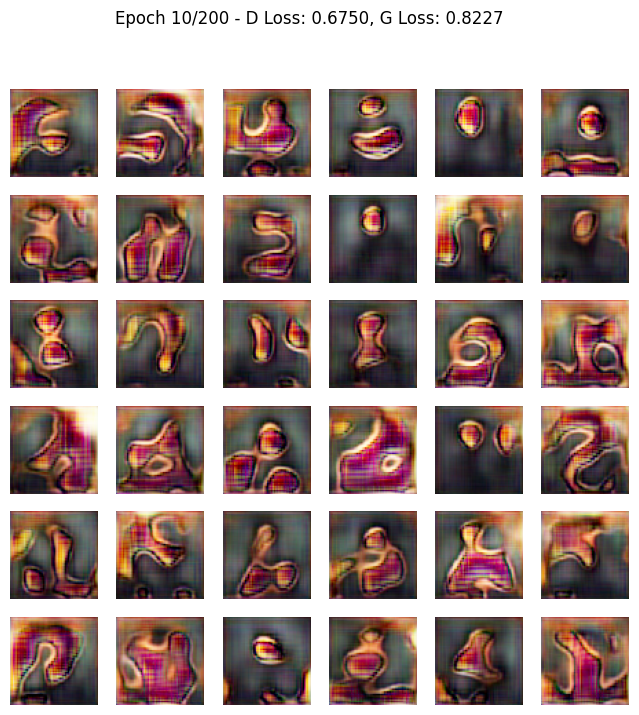

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.6780 - g_loss: 0.8261
Epoch 11/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6717 - g_loss: 0.8444
Epoch 12/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6768 - g_loss: 0.8362
Epoch 13/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6812 - g_loss: 0.8288
Epoch 14/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6767 - g_loss: 0.8286
Epoch 15/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6745 - g_loss: 0.8378
Epoch 16/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6799 - g_loss: 0.8265
Epoch 17/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6738 - g_loss: 0.8340
Epoch 18/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6777 - g_loss: 0.8298
Epoch 19/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6777 - g_loss: 0.8320
Epoch 20/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - d_loss: 0.6824 - g_loss: 0.8248

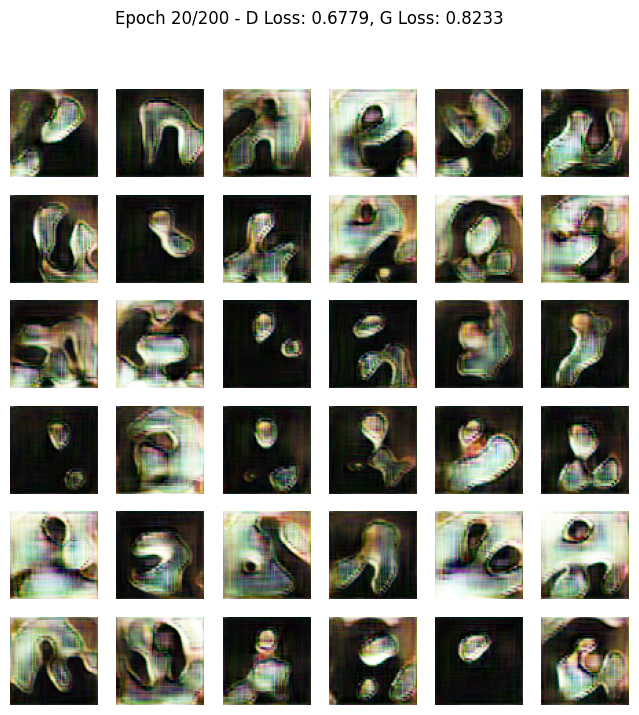

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 176ms/step - d_loss: 0.6823 - g_loss: 0.8248
Epoch 21/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - d_loss: 0.6804 - g_loss: 0.8216
Epoch 22/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6838 - g_loss: 0.8163
Epoch 23/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6810 - g_loss: 0.8036
Epoch 24/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6812 - g_loss: 0.8018
Epoch 25/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6774 - g_loss: 0.8011
Epoch 26/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6772 - g_loss: 0.7986
Epoch 27/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6773 - g_loss: 0.8098
Epoch 28/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6783 - g_loss: 0.8058
Epoch 29/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6793 - g_loss: 0.8030
Epoch 30/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - d_loss: 0.6801 - g_loss: 0.8096

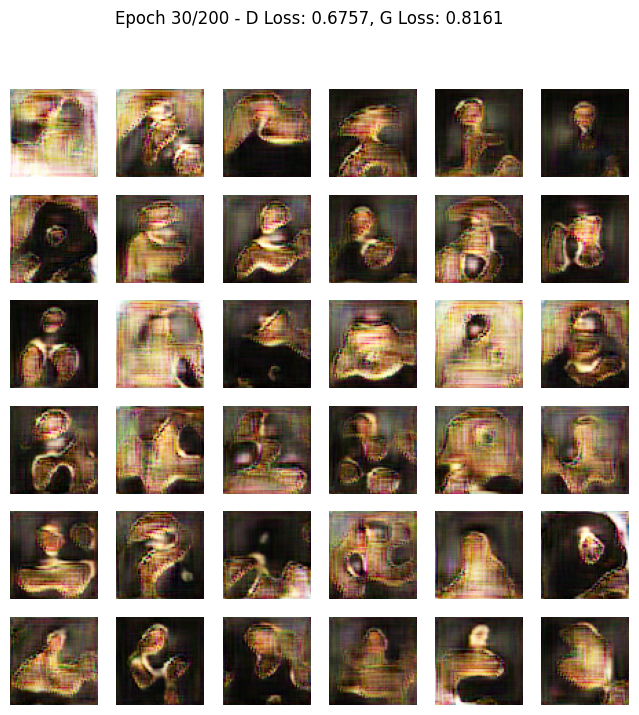

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.6801 - g_loss: 0.8097
Epoch 31/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6774 - g_loss: 0.8116
Epoch 32/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6759 - g_loss: 0.8090
Epoch 33/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6784 - g_loss: 0.8121
Epoch 34/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6765 - g_loss: 0.8210
Epoch 35/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6751 - g_loss: 0.8157
Epoch 36/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6745 - g_loss: 0.8135
Epoch 37/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6746 - g_loss: 0.8171
Epoch 38/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6742 - g_loss: 0.8254
Epoch 39/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6721 - g_loss: 0.8259
Epoch 40/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.6712 - g_loss: 0.8221

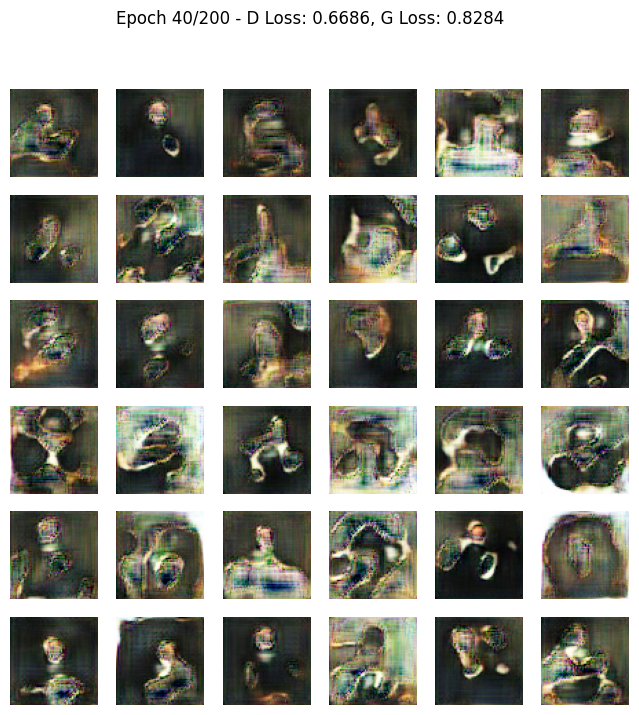

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.6712 - g_loss: 0.8222
Epoch 41/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6706 - g_loss: 0.8359
Epoch 42/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6712 - g_loss: 0.8348
Epoch 43/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6715 - g_loss: 0.8370
Epoch 44/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6697 - g_loss: 0.8405
Epoch 45/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - d_loss: 0.6637 - g_loss: 0.8447
Epoch 46/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6639 - g_loss: 0.8413
Epoch 47/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.6639 - g_loss: 0.8533
Epoch 48/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6659 - g_loss: 0.8422
Epoch 49/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6620 - g_loss: 0.8546
Epoch 50/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - d_loss: 0.6584 - g_loss: 0.8500

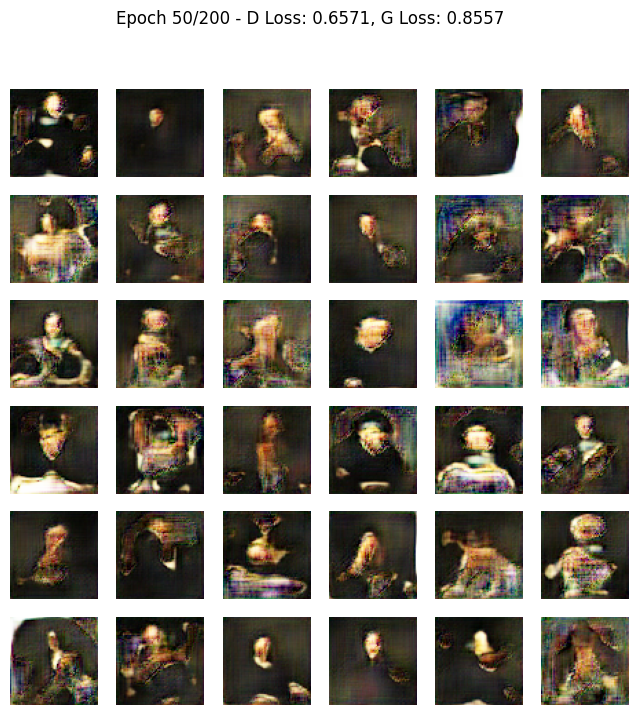

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - d_loss: 0.6584 - g_loss: 0.8501
Epoch 51/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6589 - g_loss: 0.8589
Epoch 52/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6577 - g_loss: 0.8670
Epoch 53/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6547 - g_loss: 0.8716
Epoch 54/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6576 - g_loss: 0.8674
Epoch 55/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6540 - g_loss: 0.8635
Epoch 56/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6527 - g_loss: 0.8758
Epoch 57/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6501 - g_loss: 0.8875
Epoch 58/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6454 - g_loss: 0.8840
Epoch 59/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6480 - g_loss: 0.8987
Epoch 60/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.6417 - g_loss: 0.8979

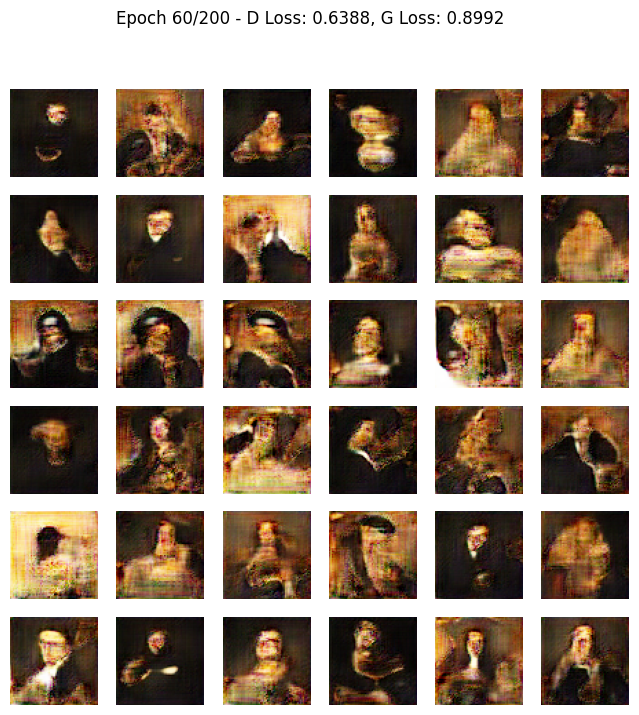

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.6416 - g_loss: 0.8980
Epoch 61/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - d_loss: 0.6451 - g_loss: 0.9131
Epoch 62/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6373 - g_loss: 0.9094
Epoch 63/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.6383 - g_loss: 0.9176
Epoch 64/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 169ms/step - d_loss: 0.6393 - g_loss: 0.9227
Epoch 65/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6336 - g_loss: 0.9306
Epoch 66/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6304 - g_loss: 0.9100
Epoch 67/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6264 - g_loss: 0.9480
Epoch 68/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6224 - g_loss: 0.9421
Epoch 69/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6227 - g_loss: 0.9466
Epoch 70/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - d_loss: 0.6243 - g_loss: 0.9696

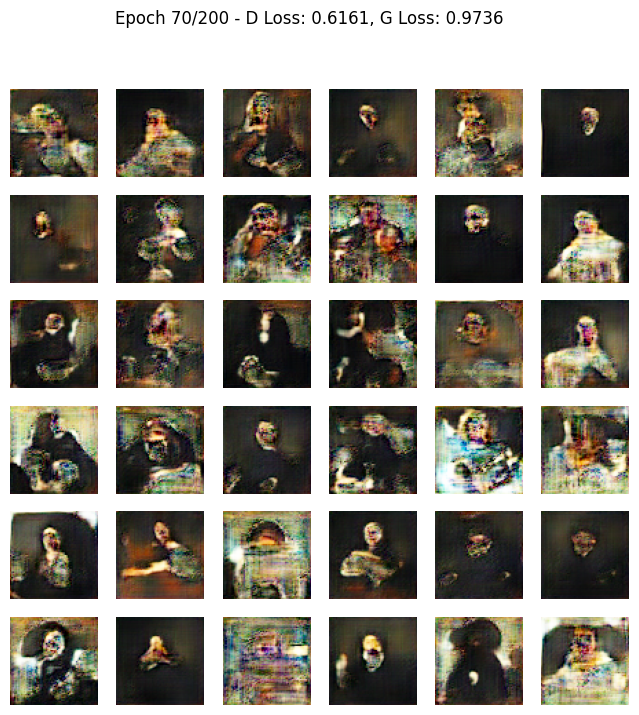

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.6242 - g_loss: 0.9696
Epoch 71/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6141 - g_loss: 0.9742
Epoch 72/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.6203 - g_loss: 0.9679
Epoch 73/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6143 - g_loss: 0.9522
Epoch 74/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.6109 - g_loss: 0.9958
Epoch 75/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6131 - g_loss: 0.9777
Epoch 76/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.6123 - g_loss: 0.9789
Epoch 77/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.6137 - g_loss: 0.9814
Epoch 78/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.6032 - g_loss: 1.0079
Epoch 79/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.6018 - g_loss: 1.0070
Epoch 80/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - d_loss: 0.5949 - g_loss: 1.0247

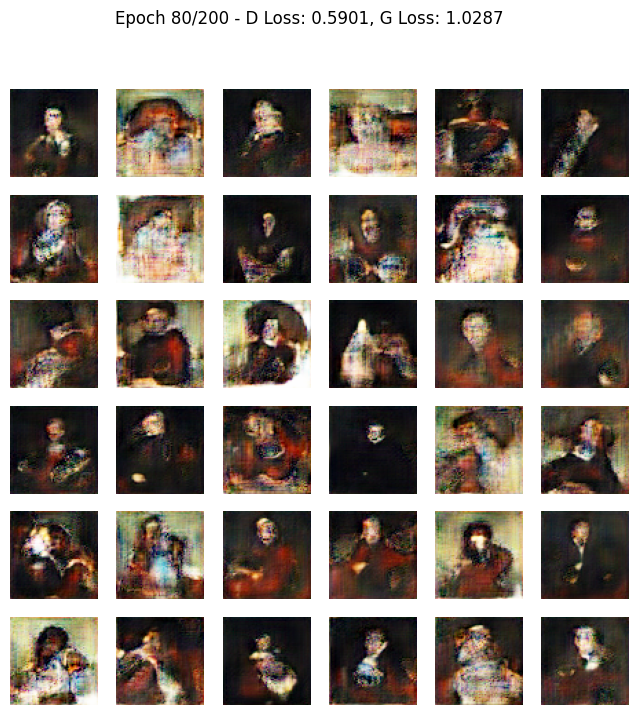

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 176ms/step - d_loss: 0.5949 - g_loss: 1.0248
Epoch 81/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.5955 - g_loss: 1.0086
Epoch 82/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.5935 - g_loss: 1.0334
Epoch 83/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5937 - g_loss: 1.0465
Epoch 84/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5863 - g_loss: 1.0373
Epoch 85/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.5865 - g_loss: 1.0374
Epoch 86/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5846 - g_loss: 1.0509
Epoch 87/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.5738 - g_loss: 1.0534
Epoch 88/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 25s 182ms/step - d_loss: 0.5791 - g_loss: 1.0680
Epoch 89/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.5739 - g_loss: 1.0686
Epoch 90/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.5714 - g_loss: 1.0662

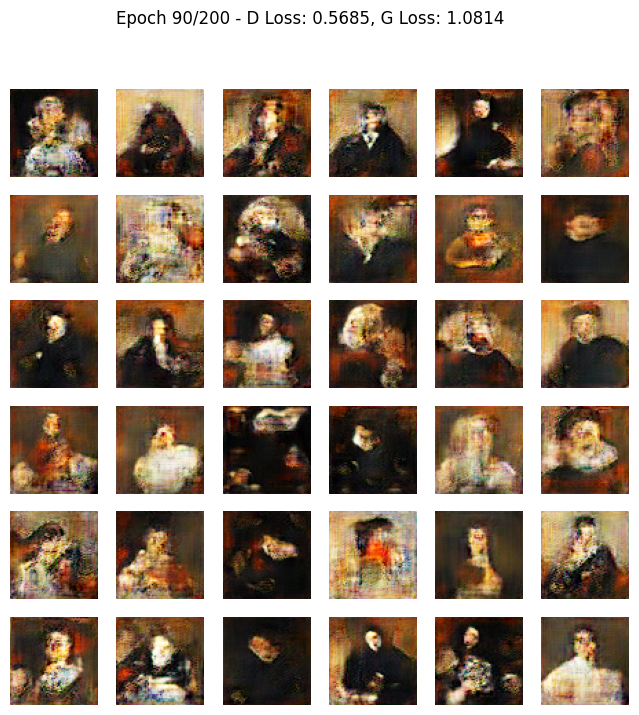

129/129 ━━━━━━━━━━━━━━━━━━━━ 25s 179ms/step - d_loss: 0.5713 - g_loss: 1.0664
Epoch 91/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.5768 - g_loss: 1.0813
Epoch 92/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5709 - g_loss: 1.0798
Epoch 93/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - d_loss: 0.5616 - g_loss: 1.1074
Epoch 94/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.5518 - g_loss: 1.1092
Epoch 95/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.5497 - g_loss: 1.1088
Epoch 96/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.5493 - g_loss: 1.1194
Epoch 97/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5459 - g_loss: 1.1390
Epoch 98/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.5443 - g_loss: 1.1307
Epoch 99/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5405 - g_loss: 1.1377
Epoch 100/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.5360 - g_loss: 1.1721

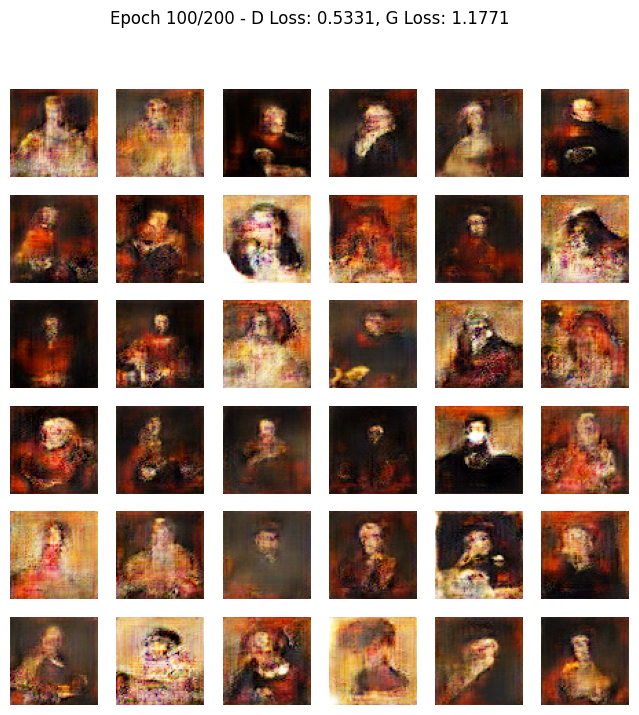

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.5360 - g_loss: 1.1722
Epoch 101/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.5376 - g_loss: 1.1773
Epoch 102/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.5246 - g_loss: 1.1701
Epoch 103/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.5222 - g_loss: 1.1606
Epoch 104/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.5218 - g_loss: 1.2178
Epoch 105/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.5138 - g_loss: 1.2234
Epoch 106/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - d_loss: 0.5119 - g_loss: 1.2254
Epoch 107/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - d_loss: 0.5095 - g_loss: 1.2376
Epoch 108/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4986 - g_loss: 1.2821
Epoch 109/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.5017 - g_loss: 1.2727
Epoch 110/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - d_loss: 0.4979 - g_loss: 1.2591

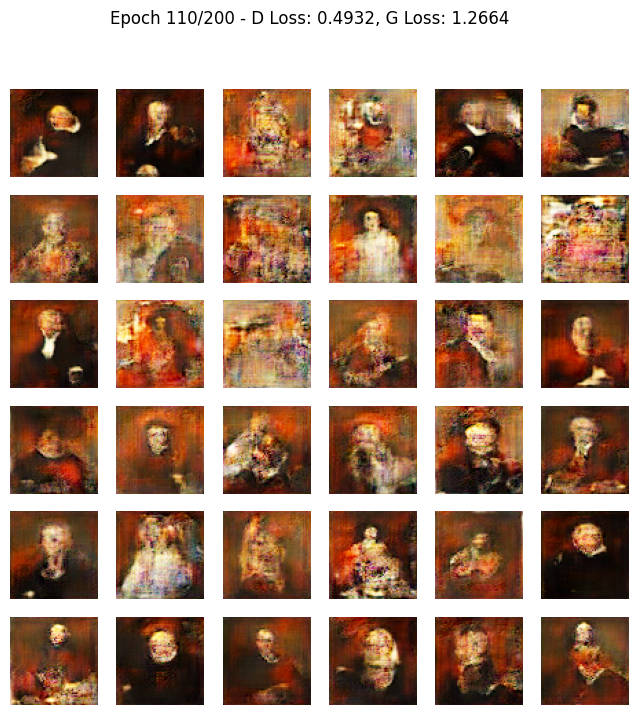

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - d_loss: 0.4978 - g_loss: 1.2593
Epoch 111/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 169ms/step - d_loss: 0.4985 - g_loss: 1.2799
Epoch 112/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 169ms/step - d_loss: 0.4900 - g_loss: 1.2761
Epoch 113/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.4839 - g_loss: 1.3247
Epoch 114/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - d_loss: 0.4787 - g_loss: 1.3333
Epoch 115/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4769 - g_loss: 1.3507
Epoch 116/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.4868 - g_loss: 1.3374
Epoch 117/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4750 - g_loss: 1.3377
Epoch 118/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4639 - g_loss: 1.3595
Epoch 119/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.4559 - g_loss: 1.3780
Epoch 120/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.4536 - g_loss: 1.3652

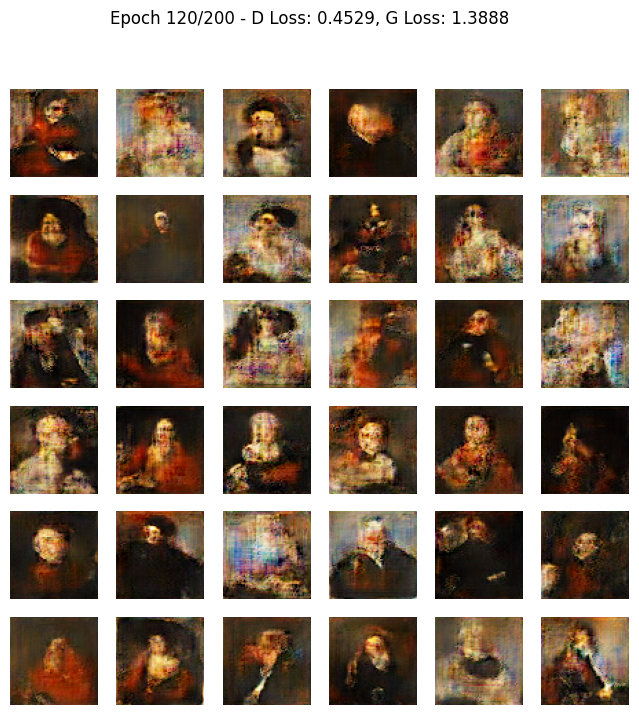

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 176ms/step - d_loss: 0.4536 - g_loss: 1.3656
Epoch 121/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - d_loss: 0.4629 - g_loss: 1.4065
Epoch 122/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4557 - g_loss: 1.4347
Epoch 123/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4457 - g_loss: 1.4128
Epoch 124/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4430 - g_loss: 1.4750
Epoch 125/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4405 - g_loss: 1.4443
Epoch 126/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4372 - g_loss: 1.4671
Epoch 127/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 170ms/step - d_loss: 0.4380 - g_loss: 1.4619
Epoch 128/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.4384 - g_loss: 1.4974
Epoch 129/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4343 - g_loss: 1.5104
Epoch 130/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.4394 - g_loss: 1.5442

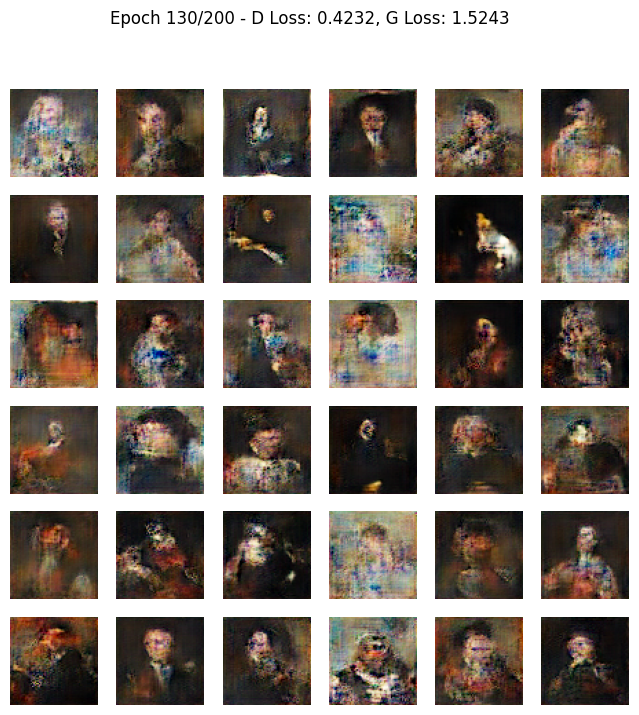

129/129 ━━━━━━━━━━━━━━━━━━━━ 25s 179ms/step - d_loss: 0.4391 - g_loss: 1.5439
Epoch 131/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.4219 - g_loss: 1.4962
Epoch 132/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4194 - g_loss: 1.4976
Epoch 133/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.4189 - g_loss: 1.5832
Epoch 134/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.4081 - g_loss: 1.5400
Epoch 135/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.4068 - g_loss: 1.5863
Epoch 136/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.4027 - g_loss: 1.5638
Epoch 137/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3905 - g_loss: 1.6051
Epoch 138/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3970 - g_loss: 1.6060
Epoch 139/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3929 - g_loss: 1.6385
Epoch 140/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - d_loss: 0.3845 - g_loss: 1.6310

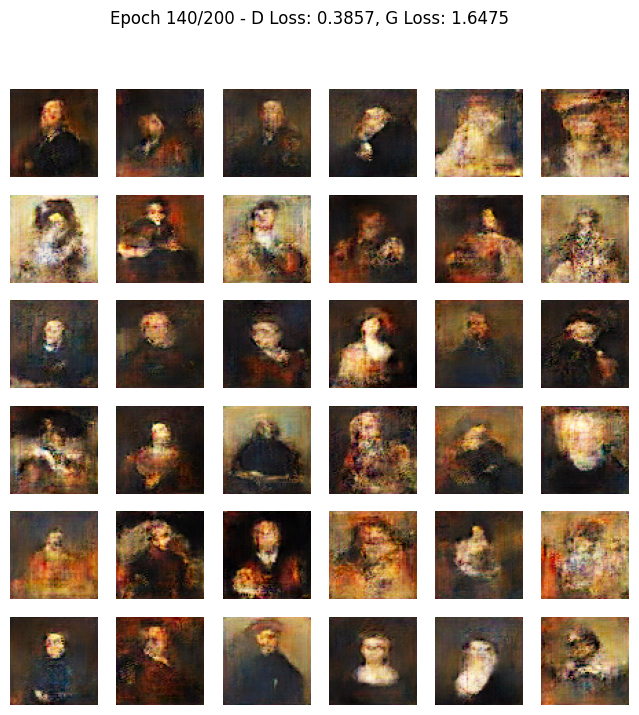

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - d_loss: 0.3846 - g_loss: 1.6313
Epoch 141/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3855 - g_loss: 1.6977
Epoch 142/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3828 - g_loss: 1.6452
Epoch 143/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3692 - g_loss: 1.6802
Epoch 144/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3847 - g_loss: 1.7021
Epoch 145/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3766 - g_loss: 1.7023
Epoch 146/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3729 - g_loss: 1.7323
Epoch 147/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3684 - g_loss: 1.7122
Epoch 148/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3676 - g_loss: 1.7991
Epoch 149/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3555 - g_loss: 1.7777
Epoch 150/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - d_loss: 0.3548 - g_loss: 1.7582

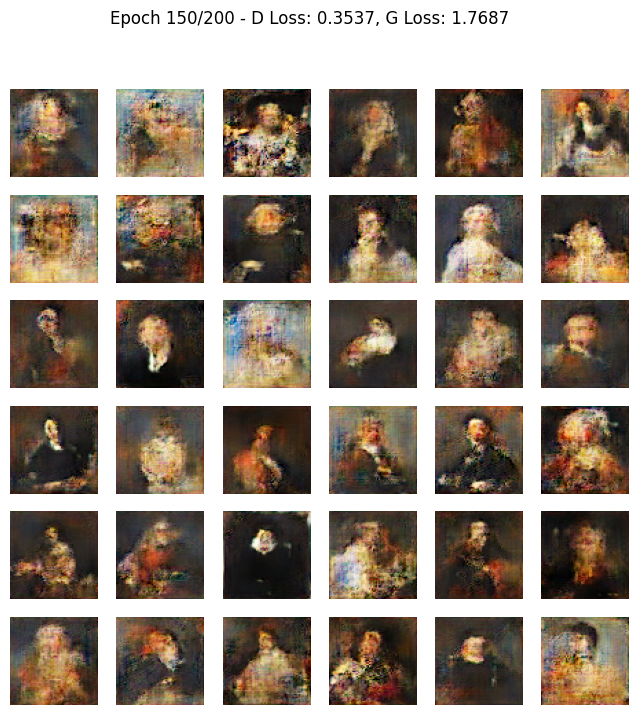

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 177ms/step - d_loss: 0.3548 - g_loss: 1.7583
Epoch 151/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - d_loss: 0.3502 - g_loss: 1.7473
Epoch 152/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.3381 - g_loss: 1.8193
Epoch 153/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 25s 178ms/step - d_loss: 0.3478 - g_loss: 1.8209
Epoch 154/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3386 - g_loss: 1.8185
Epoch 155/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3564 - g_loss: 1.8285
Epoch 156/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3341 - g_loss: 1.8401
Epoch 157/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.3327 - g_loss: 1.8622
Epoch 158/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3310 - g_loss: 1.8950
Epoch 159/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3205 - g_loss: 1.9249
Epoch 160/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.3224 - g_loss: 1.9410

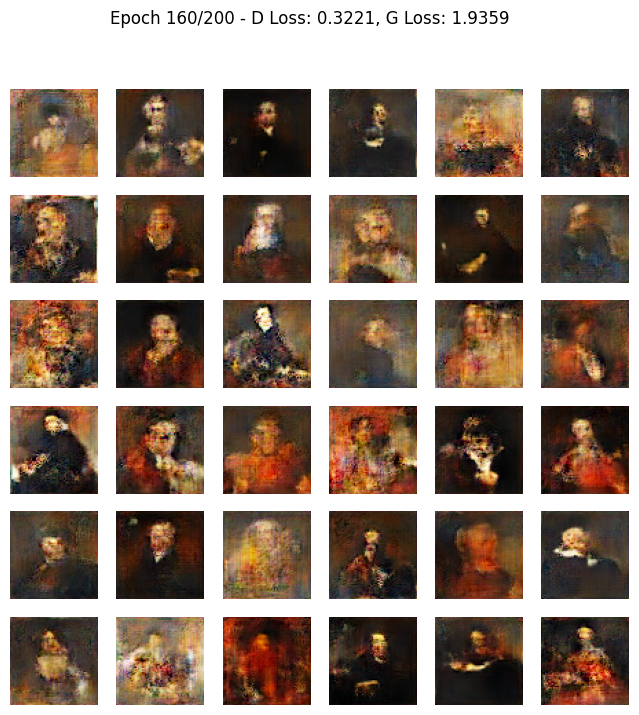

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.3224 - g_loss: 1.9409
Epoch 161/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3183 - g_loss: 1.9698
Epoch 162/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - d_loss: 0.3195 - g_loss: 2.0031
Epoch 163/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3126 - g_loss: 1.9718
Epoch 164/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3146 - g_loss: 1.9815
Epoch 165/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.3073 - g_loss: 2.0018
Epoch 166/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.3032 - g_loss: 2.0031
Epoch 167/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.3031 - g_loss: 2.0467
Epoch 168/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.2955 - g_loss: 2.0666
Epoch 169/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2908 - g_loss: 2.0626
Epoch 170/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - d_loss: 0.3006 - g_loss: 2.0694

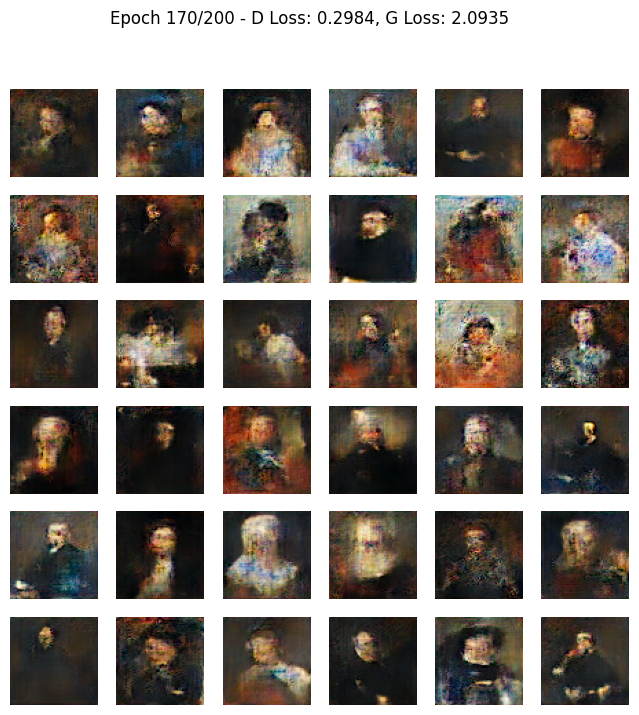

129/129 ━━━━━━━━━━━━━━━━━━━━ 25s 179ms/step - d_loss: 0.3006 - g_loss: 2.0698
Epoch 171/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - d_loss: 0.2911 - g_loss: 2.0525
Epoch 172/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.2833 - g_loss: 2.1324
Epoch 173/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.2761 - g_loss: 2.1271
Epoch 174/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2726 - g_loss: 2.1442
Epoch 175/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2721 - g_loss: 2.1099
Epoch 176/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.2646 - g_loss: 2.1790
Epoch 177/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2620 - g_loss: 2.2129
Epoch 178/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2655 - g_loss: 2.2619
Epoch 179/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2605 - g_loss: 2.2268
Epoch 180/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - d_loss: 0.2666 - g_loss: 2.1659

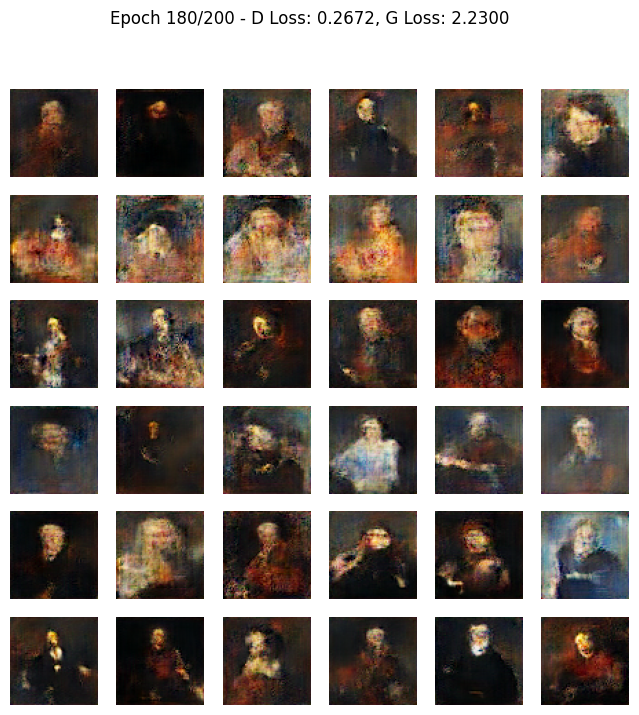

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - d_loss: 0.2666 - g_loss: 2.1668
Epoch 181/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2572 - g_loss: 2.2720
Epoch 182/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.2559 - g_loss: 2.2945
Epoch 183/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2586 - g_loss: 2.3085
Epoch 184/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2467 - g_loss: 2.3446
Epoch 185/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - d_loss: 0.2527 - g_loss: 2.3415
Epoch 186/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - d_loss: 0.2423 - g_loss: 2.3215
Epoch 187/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2422 - g_loss: 2.3536
Epoch 188/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 30s 220ms/step - d_loss: 0.2372 - g_loss: 2.3900
Epoch 189/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2319 - g_loss: 2.3771
Epoch 190/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.2310 - g_loss: 2.4089

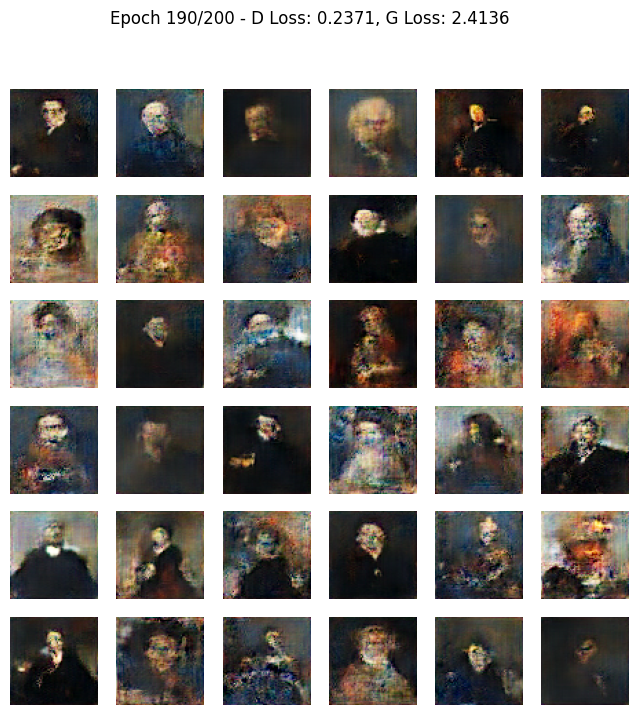

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 177ms/step - d_loss: 0.2311 - g_loss: 2.4090
Epoch 191/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - d_loss: 0.2298 - g_loss: 2.3886
Epoch 192/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - d_loss: 0.2266 - g_loss: 2.4315
Epoch 193/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2272 - g_loss: 2.5196
Epoch 194/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2323 - g_loss: 2.4494
Epoch 195/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2166 - g_loss: 2.5151
Epoch 196/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - d_loss: 0.2120 - g_loss: 2.5638
Epoch 197/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - d_loss: 0.2099 - g_loss: 2.5669
Epoch 198/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - d_loss: 0.2161 - g_loss: 2.5739
Epoch 199/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - d_loss: 0.2147 - g_loss: 2.5914
Epoch 200/200
128/129 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - d_loss: 0.2162 - g_loss: 2.5272

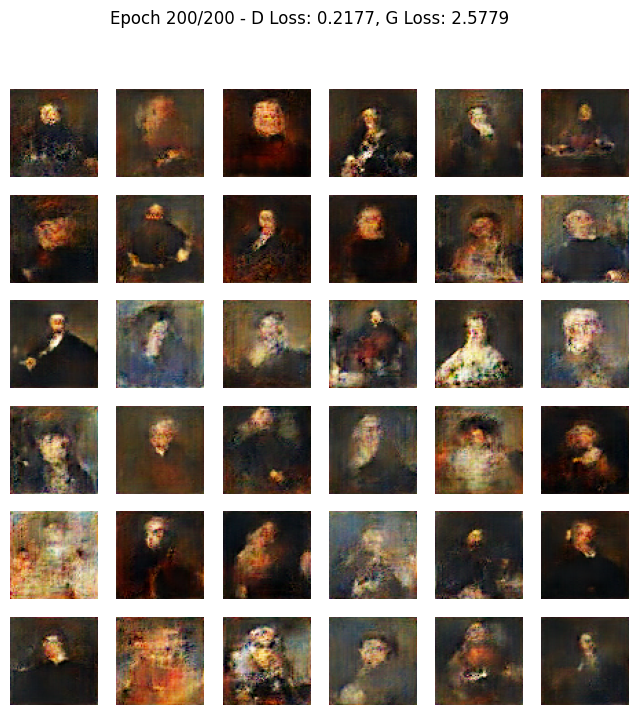

129/129 ━━━━━━━━━━━━━━━━━━━━ 24s 174ms/step - d_loss: 0.2162 - g_loss: 2.5279


In [10]:
epochs = 200
batch_size = 32
learning_rate = 0.0001
decay_steps = 1000
decay_rate = 0.95
epsilon = 1e-07

d_learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(learning_rate,decay_steps,decay_rate,
                                                              staircase=True)
g_learning_rate = tf.keras.optimizers.schedules.ExponentialDecay(learning_rate, decay_steps, decay_rate, 
                                                                 staircase=True)

model=GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

model.compile(d_optimizer=tf.keras.optimizers.RMSprop(learning_rate=d_learning_rate,epsilon=epsilon),
            g_optimizer=tf.keras.optimizers.RMSprop(learning_rate=g_learning_rate,epsilon=epsilon),
            loss_fun=tf.keras.losses.BinaryCrossentropy())
image_callback = ImageGeneratorCallback(latent_dim)
history = model.fit(data, epochs=epochs, batch_size=batch_size, callbacks=[image_callback])

In [11]:
import io
import os
import zipfile


zip_buffer = io.BytesIO()

with zipfile.ZipFile(zip_buffer, 'a', zipfile.ZIP_DEFLATED, False) as zip_file:
    for epoch, generated_images in enumerate(image_callback.generated_images, start=1):
        fig, axs = plt.subplots(6, 6, figsize=(10, 10))
        for i in range(6):
            for j in range(6):
                axs[i, j].imshow(generated_images[i * 6 + j])
                axs[i, j].axis('off')
        
        plt.suptitle(f"Epoch {epoch}/{epochs}")
        plt.savefig(f"epoch_{epoch}_images.png")
        plt.close(fig)
        
        zip_file.write(f"epoch_{epoch}_images.png", f"epoch_{epoch}_images.png")
        os.remove(f"epoch_{epoch}_images.png")

with open("generated_images.zip", "wb") as f:
    f.write(zip_buffer.getvalue())


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


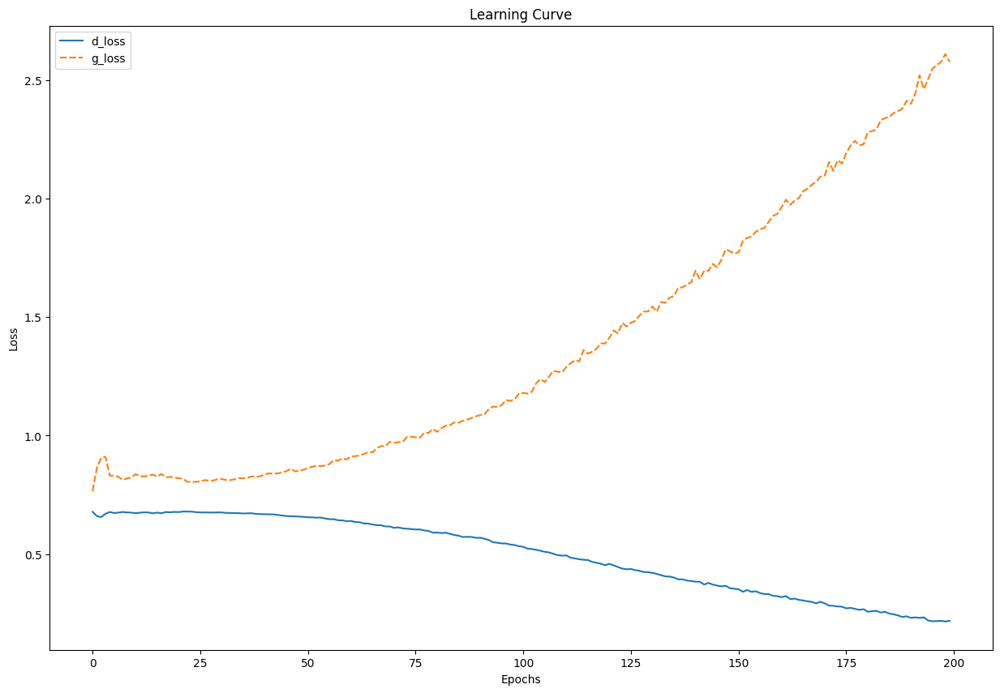

In [13]:
import seaborn as sns
fig = plt.figure(figsize=(15, 10))
ax = sns.lineplot(data=history.history)
ax.set(xlabel="Epochs")
ax.set(ylabel="Loss")
ax.set_title("Learning Curve")
plt.show()

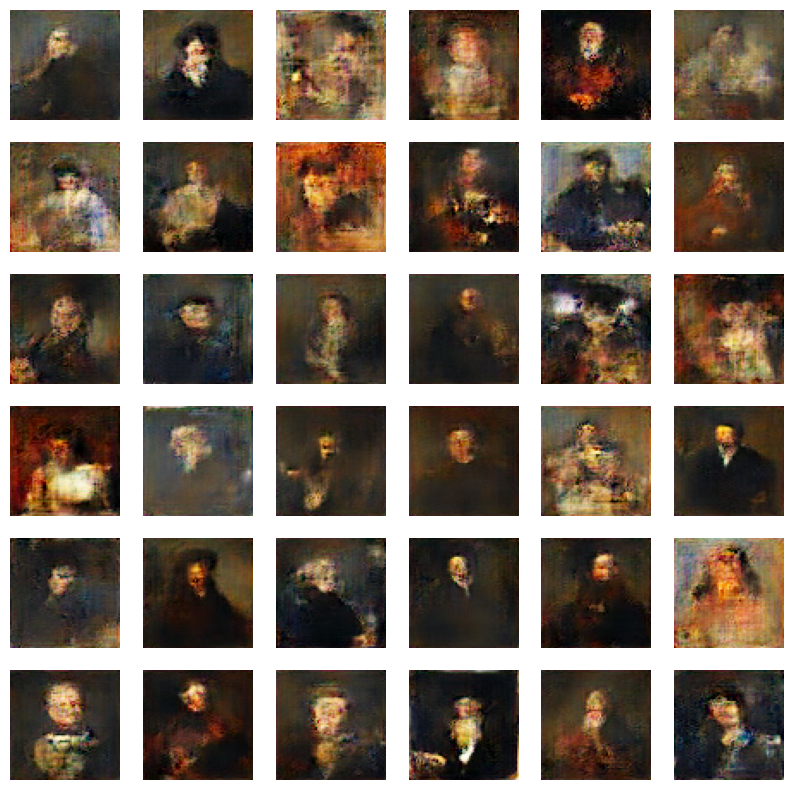

In [15]:


def generate_and_display_images(generator, num_images, latent_dim):
    generated_images = generator(tf.random.normal([num_images, latent_dim]), training=False)
    
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(num_images//6, num_images//6, i+1)
        plt.imshow(generated_images[i], cmap='gray', vmin=0, vmax=1)
        plt.axis('off')
    plt.show()

num_images = 36
generate_and_display_images(generator, num_images, latent_dim)
